In [28]:
# Data manipulation
import pandas as pd
import numpy as np

# Geo data handling
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
import branca.colormap as cm

# Importing data from web
import requests
import json
from io import BytesIO
from zipfile import ZipFile
import tempfile

# Widgets and display utilities
import ipywidgets as widgets
from IPython.display import display

# Machine learning preprocessing and evaluation
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Set matplotlib to display inline in Jupyter Notebooks
%matplotlib inline

In [2]:
# Define a function to download and read a CSV file.
def download_and_load_csv(url):
    response = requests.get(url)
    csv_string = response.content.decode('utf-8')
    df = pd.read_csv(io.StringIO(csv_string))
    return df

# API Link
download_link_1 = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/business-establishments-with-address-and-industry-classification/exports/csv?lang=en&timezone=Australia%2FSydney&use_labels=true&delimiter=%2C'
download_link_2 = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/property-level-energy-consumption-modelled-on-building-attributes-baseline-2011-/exports/csv?lang=en&timezone=Australia%2FSydney&use_labels=true&delimiter=%2C'

# Use functions to download and load data
location_df = download_and_load_csv(download_link_1)
energy_df = download_and_load_csv(download_link_2)

In [3]:
# Filter for Census years 2011, 2016, and 2021, and drop specified columns
location_df1 = location_df[location_df['Census year'].isin([2011, 2016, 2021])].drop(columns=['Base property ID', 'Longitude', 'Latitude'])

energy_df1 = energy_df[['Geo Point', 'Geo Shape', 'total_2011', 'total_2016', 'total_2021', 'total_2026', 'property_id', 'floor_area']]

# Do not merge if null value exists
merged_df = pd.merge(left=location_df1, right=energy_df1, left_on='Property ID', right_on='property_id', how='inner')
merged_df

,Census year,Block ID,Property ID,CLUE small area,Trading name,Business address,Industry (ANZSIC4) code,Industry (ANZSIC4) description,Geo Point,Geo Shape,total_2011,total_2016,total_2021,total_2026,property_id,floor_area
0,2016,260,103276,Carlton,The Last Jar,614-616 Elizabeth Street MELBOURNE 3000,4520,"Pubs, Taverns and Bars","-37.80389369105187, 144.95893869538546","{""coordinates"": [[[[144.95902662333492, -37.80...",244.502837,253.979780,263.000747,106.027972,103276.0,0.00
1,2011,260,103276,Carlton,The Arthouse,614-616 Elizabeth Street MELBOURNE 3000,4400,Accommodation,"-37.80389369105187, 144.95893869538546","{""coordinates"": [[[[144.95902662333492, -37.80...",244.502837,253.979780,263.000747,106.027972,103276.0,0.00
2,2021,260,103276,Carlton,The Last Jar,Royal Artillery Hotel 614-616 Elizabeth Street...,4520,"Pubs, Taverns and Bars","-37.80389369105187, 144.95893869538546","{""coordinates"": [[[[144.95902662333492, -37.80...",244.502837,253.979780,263.000747,106.027972,103276.0,0.00
3,2016,261,103278,Carlton,vacant,"Ground , 594 Elizabeth Street MELBOURNE 3000",0,Vacant Space,"-37.80441358151051, 144.9591306771443","{""coordinates"": [[[[144.9592718317442, -37.804...",102.210974,149.527188,194.188383,237.529232,103278.0,0.00
4,2011,261,103278,Carlton,Passion Studio,"Level 1, 594 Elizabeth Street MELBOURNE 3000",8212,Arts Education,"-37.80441358151051, 144.9591306771443","{""coordinates"": [[[[144.9592718317442, -37.804...",102.210974,149.527188,194.188383,237.529232,103278.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49457,2021,224,102420,Carlton,Vacant,10-12 David Street CARLTON VIC 3053,0,Vacant Space,"-37.797109886348025, 144.97203508309082","{""coordinates"": [[[[144.97212299533473, -37.79...",0.000010,0.000000,0.000000,0.000000,102420.0,0.00
49458,2021,239,107547,Carlton,226 Jubang,Part 226 Pelham Street MELBOURNE VIC 3000,4512,Takeaway Food Services,"-37.801683996710835, 144.95824298826534","{""coordinates"": [[[[144.95825689793293, -37.80...",1.776850,15.026155,16.837628,19.252926,107547.0,150.20
49459,2021,856,109887,South Yarra,Vacant,177-181 Walsh Street SOUTH YARRA VIC 3141,0,Vacant Space,"-37.83387671785113, 144.98531467949826","{""coordinates"": [[[[144.9851083930342, -37.833...",6.045115,33.802171,38.682549,44.783022,109887.0,563.08
49460,2021,927,106407,Parkville,Vacant,101-105 Manningham Street PARKVILLE VIC 3052,0,Vacant Space,"-37.78447231814965, 144.94130458786003","{""coordinates"": [[[[144.94120204783886, -37.78...",40.174526,119.082158,137.622928,157.236091,106407.0,806.05


In [4]:
# 获取并打印'Census year'列的所有唯一值
unique_years = merged_df['Census year'].unique()
print(unique_years)


[2016 2011 2021]


In [5]:
# Methods for preparing the energy consumption datasets

def get_coords(row):
    # Parse the 'Geo Shape' data from a JSON string to a Python dictionary
    geo_shape = json.loads(row['geometry'])

    # Check if the geometry type is 'MultiPolygon'
    if geo_shape['type'] == 'MultiPolygon':
        # Extract coordinates for MultiPolygon
        coordinates = geo_shape['coordinates']
        polygons = [Polygon(p[0]) for p in coordinates]  # Extract each polygon
        row["geometry"] = MultiPolygon(polygons)
    else:
        row["geometry"] = None  # Handle other types or malformed data
    return row

def prepare_dataset(dataframe):
    # Create a new DataFrame to store the modified data
    new_dataframe = dataframe.copy()

    # Rename columns as needed
    new_dataframe = new_dataframe.rename(columns={"Geo Shape" : "geometry"})

    # Apply the get_coords function and update the 'geometry' column
    new_dataframe['geometry'] = new_dataframe.apply(get_coords, axis=1)['geometry']

    # Convert numeric columns
    new_dataframe["total_2011"] = pd.to_numeric(new_dataframe['total_2011'], errors='coerce')
    new_dataframe["total_2016"] = pd.to_numeric(new_dataframe['total_2016'], errors='coerce')
    new_dataframe["total_2021"] = pd.to_numeric(new_dataframe['total_2021'], errors='coerce')
    new_dataframe["total_2026"] = pd.to_numeric(new_dataframe['total_2026'], errors='coerce')
    new_dataframe["floor_area"] = pd.to_numeric(new_dataframe['floor_area'], errors='coerce')

    # Convert the DataFrame to a GeoDataFrame
    return gpd.GeoDataFrame(new_dataframe, geometry='geometry', crs=4326)

In [6]:
model_gdf = prepare_dataset(merged_df)

model_gdf

,Census year,Block ID,Property ID,CLUE small area,Trading name,Business address,Industry (ANZSIC4) code,Industry (ANZSIC4) description,Geo Point,geometry,total_2011,total_2016,total_2021,total_2026,property_id,floor_area
0,2016,260,103276,Carlton,The Last Jar,614-616 Elizabeth Street MELBOURNE 3000,4520,"Pubs, Taverns and Bars","-37.80389369105187, 144.95893869538546","MULTIPOLYGON (((144.95903 -37.80380, 144.95909...",244.502837,253.979780,263.000747,106.027972,103276.0,0.00
1,2011,260,103276,Carlton,The Arthouse,614-616 Elizabeth Street MELBOURNE 3000,4400,Accommodation,"-37.80389369105187, 144.95893869538546","MULTIPOLYGON (((144.95903 -37.80380, 144.95909...",244.502837,253.979780,263.000747,106.027972,103276.0,0.00
2,2021,260,103276,Carlton,The Last Jar,Royal Artillery Hotel 614-616 Elizabeth Street...,4520,"Pubs, Taverns and Bars","-37.80389369105187, 144.95893869538546","MULTIPOLYGON (((144.95903 -37.80380, 144.95909...",244.502837,253.979780,263.000747,106.027972,103276.0,0.00
3,2016,261,103278,Carlton,vacant,"Ground , 594 Elizabeth Street MELBOURNE 3000",0,Vacant Space,"-37.80441358151051, 144.9591306771443","MULTIPOLYGON (((144.95927 -37.80443, 144.95904...",102.210974,149.527188,194.188383,237.529232,103278.0,0.00
4,2011,261,103278,Carlton,Passion Studio,"Level 1, 594 Elizabeth Street MELBOURNE 3000",8212,Arts Education,"-37.80441358151051, 144.9591306771443","MULTIPOLYGON (((144.95927 -37.80443, 144.95904...",102.210974,149.527188,194.188383,237.529232,103278.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49457,2021,224,102420,Carlton,Vacant,10-12 David Street CARLTON VIC 3053,0,Vacant Space,"-37.797109886348025, 144.97203508309082","MULTIPOLYGON (((144.97212 -37.79717, 144.97193...",0.000010,0.000000,0.000000,0.000000,102420.0,0.00
49458,2021,239,107547,Carlton,226 Jubang,Part 226 Pelham Street MELBOURNE VIC 3000,4512,Takeaway Food Services,"-37.801683996710835, 144.95824298826534","MULTIPOLYGON (((144.95826 -37.80177, 144.95820...",1.776850,15.026155,16.837628,19.252926,107547.0,150.20
49459,2021,856,109887,South Yarra,Vacant,177-181 Walsh Street SOUTH YARRA VIC 3141,0,Vacant Space,"-37.83387671785113, 144.98531467949826","MULTIPOLYGON (((144.98511 -37.83378, 144.98555...",6.045115,33.802171,38.682549,44.783022,109887.0,563.08
49460,2021,927,106407,Parkville,Vacant,101-105 Manningham Street PARKVILLE VIC 3052,0,Vacant Space,"-37.78447231814965, 144.94130458786003","MULTIPOLYGON (((144.94120 -37.78465, 144.94106...",40.174526,119.082158,137.622928,157.236091,106407.0,806.05


In [7]:
# 获取并打印'Census year'列的所有唯一值
unique_years = model_gdf['Census year'].unique()
print(unique_years)

[2016 2011 2021]


In [8]:
# 假设model_gdf是包含所有数据的DataFrame
# 先将DataFrame转换为GeoDataFrame
gdf = gpd.GeoDataFrame(model_gdf, geometry=gpd.points_from_xy(model_gdf['Geo Point'].apply(
    lambda x: float(x.split(',')[1])), model_gdf['Geo Point'].apply(lambda x: float(x.split(',')[0]))))

# 计算每个物业ID每年的行业数量
gdf['industry_count'] = gdf.groupby(['Property ID', 'Census year'])['Industry (ANZSIC4) code'].transform('nunique')

# 地图绘制函数，包括年份选择的交互
def plot_industry_count_by_year_interactive(year):
    def internal_plot(year):
        if year not in [2011, 2016, 2021]:
            print("Unsupported year. Please choose from 2011, 2016, or 2021.")
            return
        # 过滤指定年份的数据
        df_year = gdf[gdf['Census year'] == year]

        # 初始化地图
        m = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)
        # 使用MarkerCluster
        marker_cluster = MarkerCluster().add_to(m)

        # 为每个位置添加数字标签
        for _, row in df_year.iterrows():
            folium.Marker(
                location=[row.geometry.y, row.geometry.x],
                icon=folium.DivIcon(html=f"""<div style="font-family: 'Arial'; color: 'blue'; font-size: 12pt">{row['industry_count']}</div>""")
            ).add_to(marker_cluster)

        # 显示地图
        return m

    # 调用内部函数并显示结果
    map_display = internal_plot(year)
    display(map_display)

# 创建下拉菜单
year_selector = widgets.Dropdown(
    options=[2011, 2016, 2021],
    value=2011,
    description='Year:',
    disabled=False,
)

# 创建一个交互式组件，将下拉菜单链接到地图绘制函数
widgets.interactive(plot_industry_count_by_year_interactive, year=year_selector)


interactive(children=(Dropdown(description='Year:', options=(2011, 2016, 2021), value=2011), Output()), _dom_c…

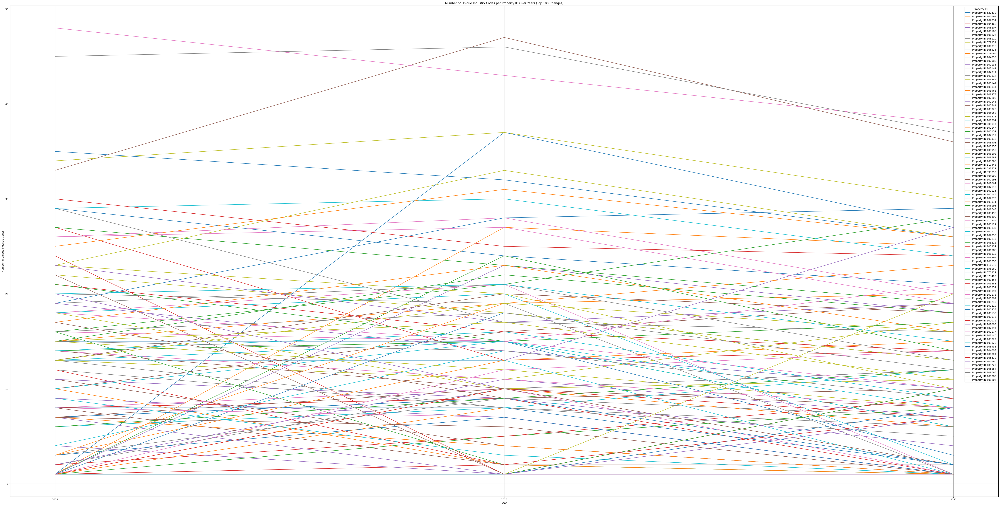

In [9]:
# 假设model_gdf已经按['Property ID', 'Census year']分组并计算了每年的Industry (ANZSIC4) code的唯一数量
industry_count_per_year = model_gdf.groupby(['Property ID', 'Census year'])['Industry (ANZSIC4) code'].nunique().unstack()

# 计算每个Property ID的行业代码数量的变化量
industry_change = industry_count_per_year.apply(lambda x: x.max() - x.min(), axis=1)

# 选取变化最大的100个Property ID
top_100_ids = industry_change.nlargest(100).index

# 绘制折线图
plt.figure(figsize=(72, 36))
for pid in top_100_ids:
    industry_count_per_year.loc[pid].plot(label=f'Property ID {pid}')

plt.title('Number of Unique Industry Codes per Property ID Over Years (Top 100 Changes)')
plt.xlabel('Year')
plt.ylabel('Number of Unique Industry Codes')
plt.legend(title='Property ID')
plt.xticks([2011, 2016, 2021], labels=['2011', '2016', '2021'])  # 确保所有年份都显示
plt.grid(True)
plt.show()

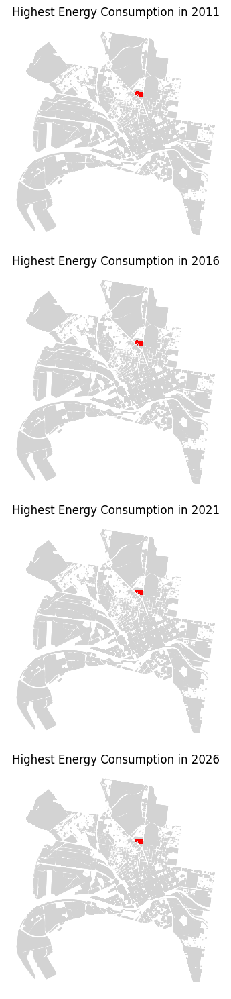

In [10]:
def plot_highest_energy_consumption(gdf, years):
    """
    Plot the highest energy-consuming properties for given years.

    Parameters:
    gdf (GeoDataFrame): GeoDataFrame containing the property data.
    years (list): List of years to consider.
    """
    fig, axs = plt.subplots(nrows=len(years), ncols=1, figsize=(10, 15))

    if len(years) == 1:
        axs = [axs]  # Make sure axs is iterable

    for year, ax in zip(years, axs):
        total_column = f'total_{year}'

        # Ensure the column exists
        if total_column not in gdf.columns:
            print(f"Column {total_column} does not exist in the GeoDataFrame.")
            continue

        # Find the property with the highest energy consumption for the year
        max_property = gdf[gdf[total_column] == gdf[total_column].max()]

        # Plot the GeoDataFrame highlighting the max property
        gdf.plot(ax=ax, color='lightgrey')  # Plot all properties in light grey
        max_property.plot(ax=ax, color='red', legend=True)  # Plot the highest consuming property in red

        # Setting title and removing axes for clarity
        ax.set_title(f'Highest Energy Consumption in {year}')
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()

# Example usage
plot_highest_energy_consumption(model_gdf, [2011, 2016, 2021, 2026])


In [11]:
# Split data by Census year
df_2011 = model_gdf[model_gdf['Census year'] == 2011].drop(columns=['total_2016', 'total_2021', 'total_2026'])
df_2016 = model_gdf[model_gdf['Census year'] == 2016].drop(columns=['total_2011', 'total_2021', 'total_2026'])
df_2021 = model_gdf[model_gdf['Census year'] == 2021].drop(columns=['total_2011', 'total_2016', 'total_2026'])
df_2021_l = model_gdf[model_gdf['Census year'] == 2021].drop(columns=['total_2011', 'total_2016', 'total_2021'])

In [37]:
def update_total_by_code_count(df, total_column):
    """
    Updates the total column of the DataFrame based on the number of unique Industry (ANZSIC4) codes
    associated with each Property ID.

    Parameters:
    - df: pandas.DataFrame containing the data.
    - total_column: str, the name of the column containing total values that need to be updated.

    Returns:
    - df: pandas.DataFrame with the updated total column.
    """
    # 计算每个Property ID对应的Industry (ANZSIC4) code的数量
    code_counts = df.groupby('Property ID')['Industry (ANZSIC4) code'].transform('nunique')

    # 更新total列，将原来的total值除以Industry (ANZSIC4) code的数量
    df[total_column] = df[total_column] / code_counts

    return df

# 应用函数更新每个DataFrame
df_2011 = update_total_by_code_count(df_2011, 'total_2011')
df_2016 = update_total_by_code_count(df_2016, 'total_2016')
df_2021 = update_total_by_code_count(df_2021, 'total_2021')
df_2021_l = update_total_by_code_count(df_2021_l, 'total_2026')
df_2026 = df_2021_l.copy().assign(**{df_2021_l.columns[0]: 2026})

In [13]:
def get_column_extremes(df, column_name):
    """
    Returns the maximum and minimum values of a specified column in a DataFrame.

    Parameters:
    - df: pandas.DataFrame, the DataFrame to analyze.
    - column_name: str, the name of the column to find extremes for.

    Returns:
    - max_value: The maximum value in the column.
    - min_value: The minimum value in the column.
    """
    max_value = df[column_name].max()
    min_value = df[column_name].min()
    return max_value, min_value

# 查找total_2011列的最大值和最小值
max_total_2011, min_total_2011 = get_column_extremes(df_2011, 'total_2011')
max_total_2016, min_total_2016 = get_column_extremes(df_2016, 'total_2016')
max_total_2021, min_total_2021 = get_column_extremes(df_2021, 'total_2021')
max_total_2026, min_total_2026 = get_column_extremes(df_2021_l, 'total_2026')

print(f"Maximum value in total_2011: {max_total_2011}")
print(f"Maximum value in total_2016: {max_total_2016}")
print(f"Maximum value in total_2021: {max_total_2021}")
print(f"Maximum value in total_2026: {max_total_2026}")

print(f"Minimum value in total_2011: {min_total_2011}")
print(f"Minimum value in total_2016: {min_total_2016}")
print(f"Minimum value in total_2021: {min_total_2021}")
print(f"Minimum value in total_2026: {min_total_2026}")


Maximum value in total_2011: 26277.19882
Maximum value in total_2016: 42521.9122313
Maximum value in total_2021: 54113.03189
Maximum value in total_2026: 68176.42198
Minimum value in total_2011: 0.0
Minimum value in total_2016: 0.0
Minimum value in total_2021: 0.0
Minimum value in total_2026: 0.0


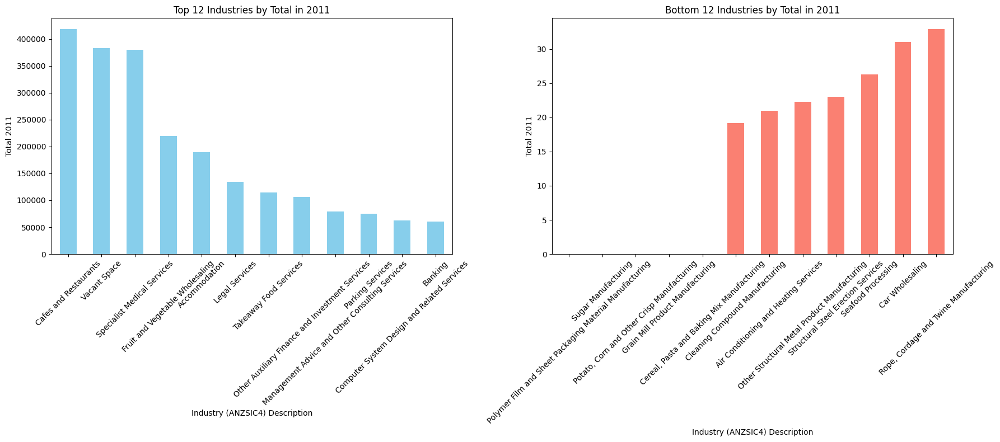

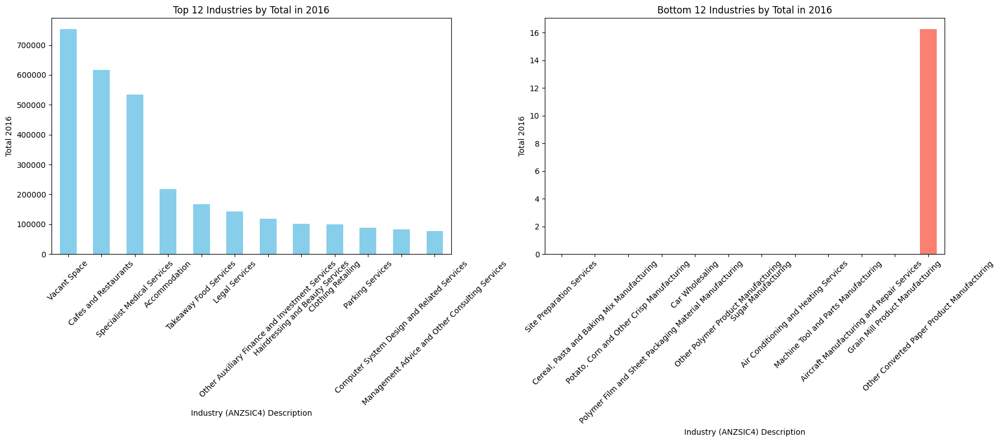

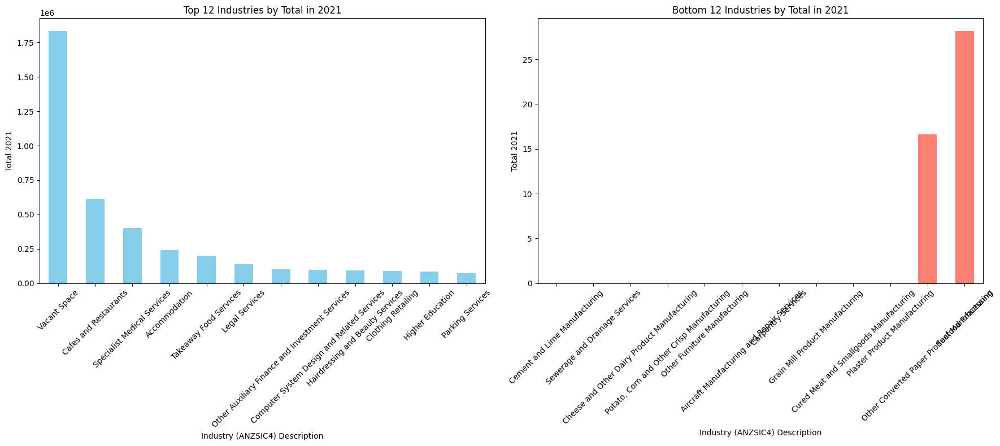

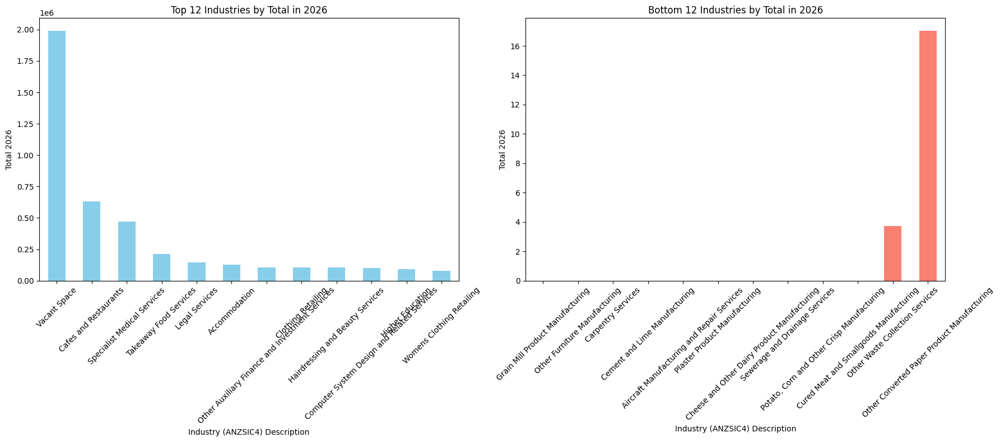

In [14]:

def plot_top_bottom_industries(df, year, n=12):
    """
    Plots top and bottom n industries by total for a given year.

    Parameters:
    df : pandas.DataFrame - The DataFrame containing the data.
    year : str - The year column suffix in the DataFrame to identify the total column.
    n : int - Number of top and bottom industries to display.
    """
    # 按行业描述分组，并计算每个行业的total对应年份的总和
    total_column = f'total_{year}'
    industry_totals = df.groupby('Industry (ANZSIC4) description')[total_column].sum()

    # 选取总和最高的前n个行业和最低的前n个行业
    top_industries = industry_totals.sort_values(ascending=False).head(n)
    bottom_industries = industry_totals.sort_values(ascending=True).head(n)

    # 创建图表
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

    # 绘制最高的n个行业
    top_industries.plot(kind='bar', color='skyblue', ax=ax1)
    ax1.set_title(f'Top {n} Industries by Total in {year}')
    ax1.set_xlabel('Industry (ANZSIC4) Description')
    ax1.set_ylabel(f'Total {year}')
    ax1.tick_params(axis='x', rotation=45)

    # 绘制最低的n个行业
    bottom_industries.plot(kind='bar', color='salmon', ax=ax2)
    ax2.set_title(f'Bottom {n} Industries by Total in {year}')
    ax2.set_xlabel('Industry (ANZSIC4) Description')
    ax2.set_ylabel(f'Total {year}')
    ax2.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()


plot_top_bottom_industries(df_2011, '2011')
plot_top_bottom_industries(df_2016, '2016')
plot_top_bottom_industries(df_2021, '2021')
plot_top_bottom_industries(df_2021_l, '2026')

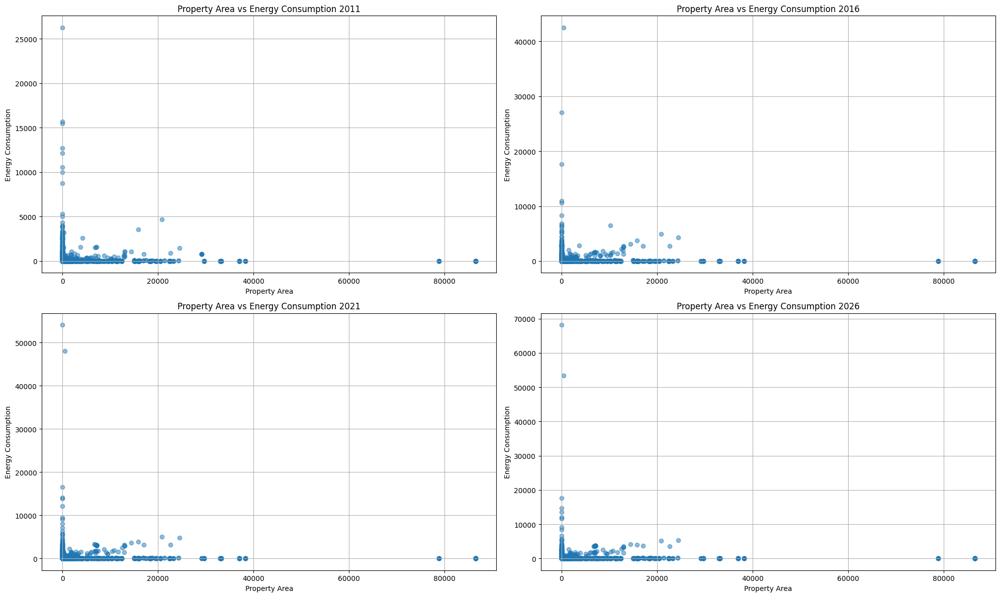

In [78]:
def plot_property_area_vs_energy_consumption(dfs, years):
    """
    Plots scatter plots of property area versus energy consumption for different years.

    Parameters:
    dfs (list of pd.DataFrame): List of DataFrames for each year.
    years (list of int): List of years corresponding to each DataFrame.
    """
    # Ensure the figure is large enough to accommodate all subplots
    plt.figure(figsize=(20, 12))

    # Loop through each DataFrame and corresponding year
    for i, (df, year) in enumerate(zip(dfs, years)):
        plt.subplot(2, 2, i + 1)  # Assume a 2x2 subplot layout
        total_column = f'total_{year}'  # Construct the column name based on the year

        # Ensure the expected total column exists in the DataFrame
        if total_column not in df.columns:
            print(f"Column {total_column} does not exist in the DataFrame for the year {year}.")
            continue

        # Plot scatter plot for the current year
        plt.scatter(df['floor_area'], df[total_column], alpha=0.5)
        plt.title(f'Property Area vs Energy Consumption {year}')
        plt.xlabel('Property Area')
        plt.ylabel('Energy Consumption')
        plt.grid(True)

    # Ensure the layout is clean and no labels are overlapping
    plt.tight_layout()
    plt.show()

# Example usage with the list of DataFrames and corresponding years
plot_property_area_vs_energy_consumption([df_2011, df_2016, df_2021, df_2021_l], [2011, 2016, 2021, 2026])


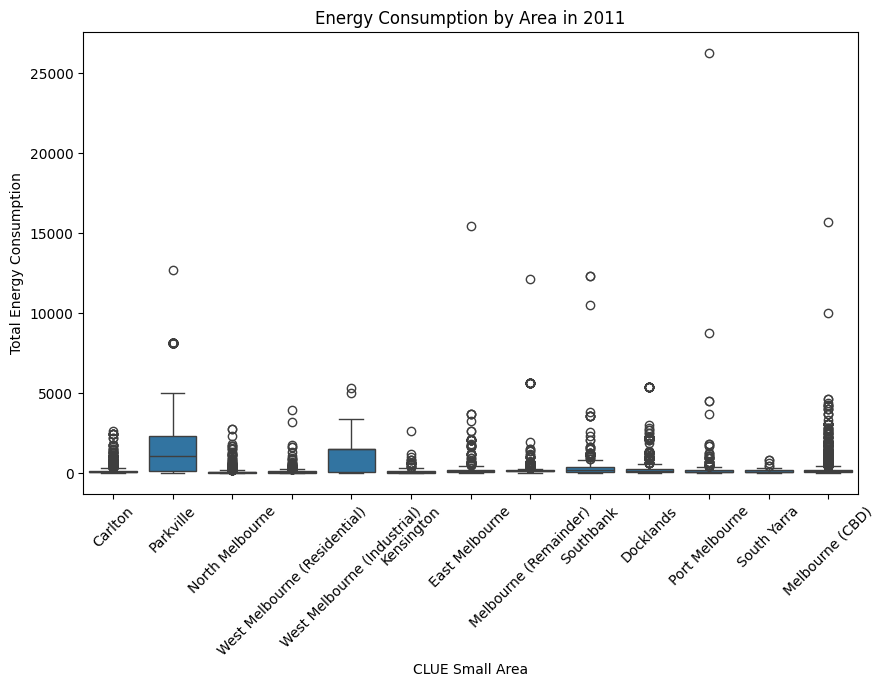

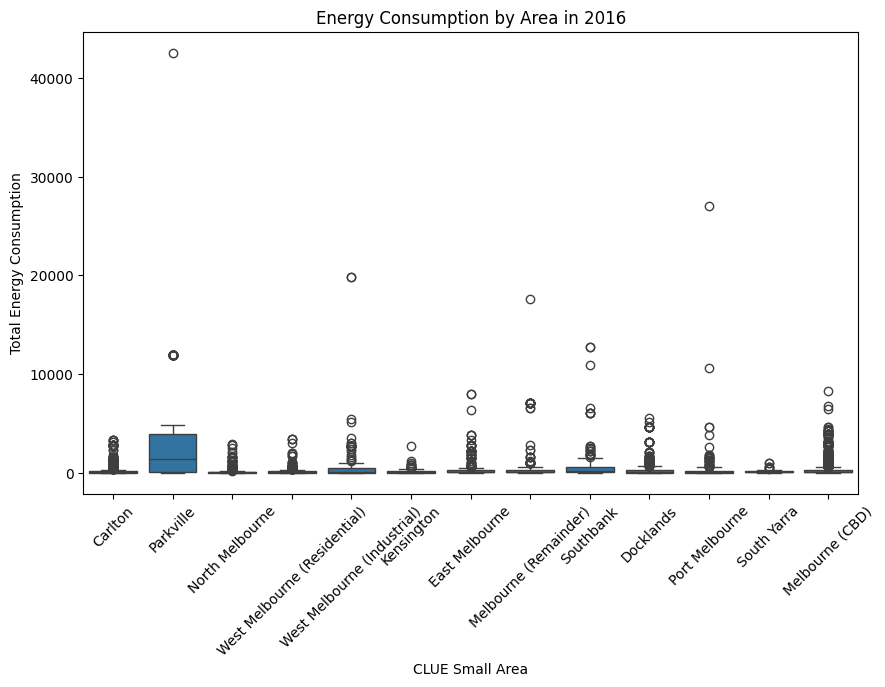

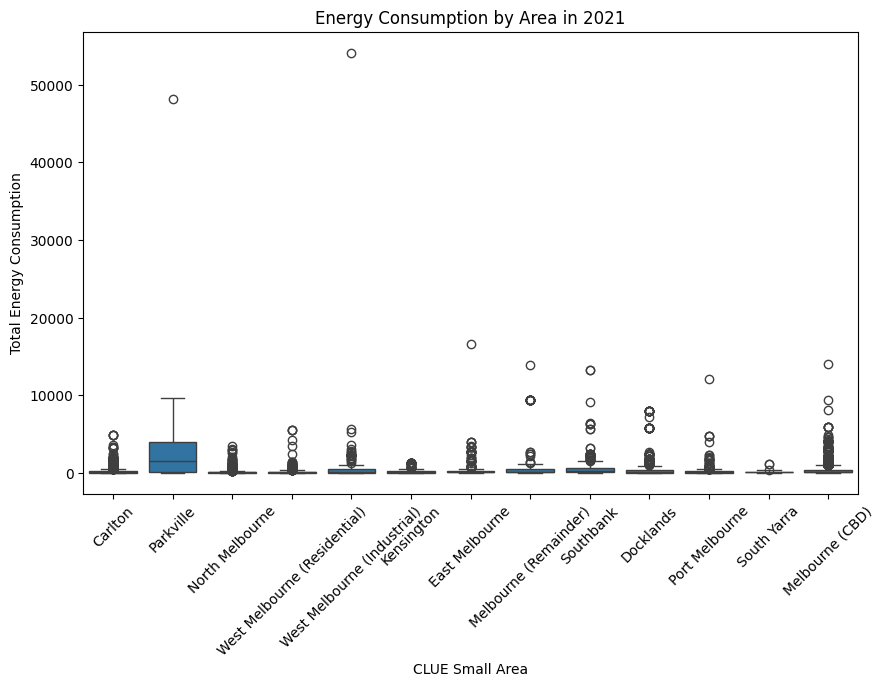

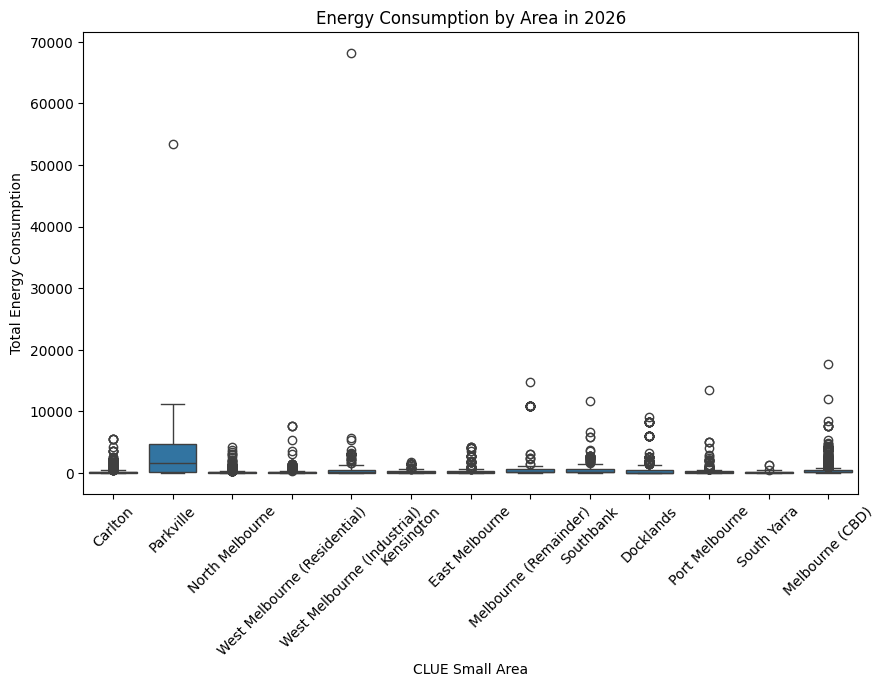

In [16]:
def plot_energy_consumption_by_area_per_year(dfs, years):
    """
    Plots individual boxplots of energy consumption for different areas, each plot corresponding to a specific year.

    Parameters:
    dfs (list of pd.DataFrame): List of DataFrames for each year.
    years (list of int): List of years corresponding to each DataFrame.
    """
    for df, year in zip(dfs, years):
        # Prepare data for plotting
        df = df.copy()
        total_column = f'total_{year}'  # Adjust based on the provided structure

        # Check if the expected total column exists in the DataFrame
        if total_column not in df.columns:
            print(f"Column {total_column} does not exist in the DataFrame for the year {year}.")
            continue

        df['Year'] = year
        df.rename(columns={total_column: 'Total Energy Consumption'}, inplace=True)
        plot_data = df[['CLUE small area', 'Total Energy Consumption']]

        # Plotting the boxplot
        plt.figure(figsize=(10, 6))  # New figure for each year
        sns.boxplot(x='CLUE small area', y='Total Energy Consumption', data=plot_data)
        plt.title(f'Energy Consumption by Area in {year}')
        plt.xlabel('CLUE Small Area')
        plt.ylabel('Total Energy Consumption')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.show()

# Example usage with hypothetical DataFrame list and corresponding years
plot_energy_consumption_by_area_per_year([df_2011, df_2016, df_2021, df_2021_l], [2011, 2016, 2021, 2026])

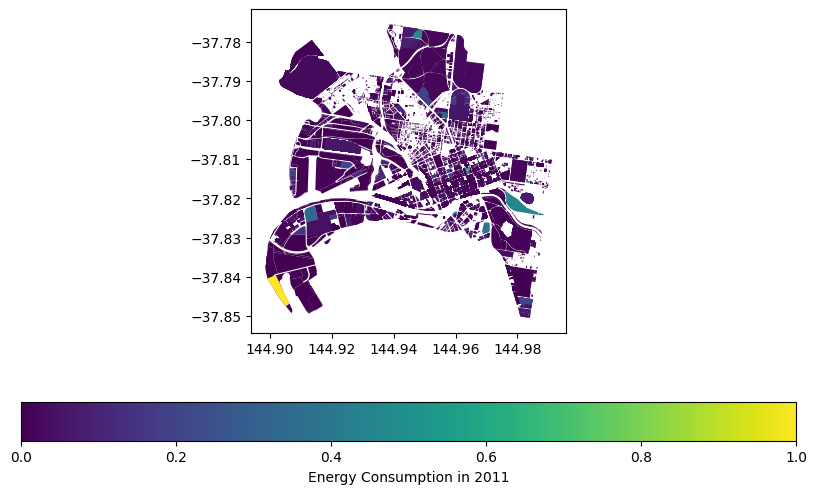

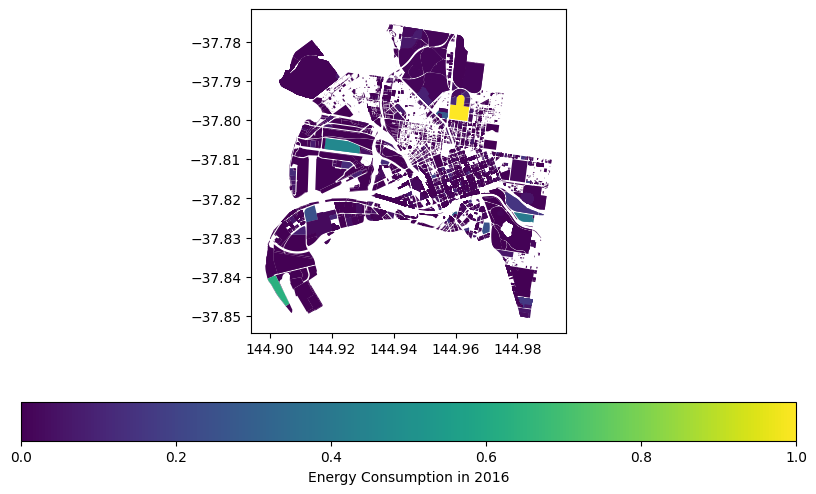

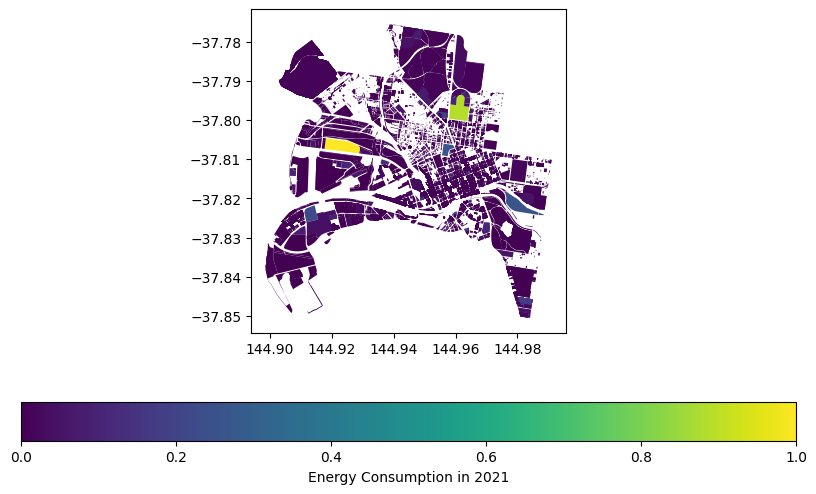

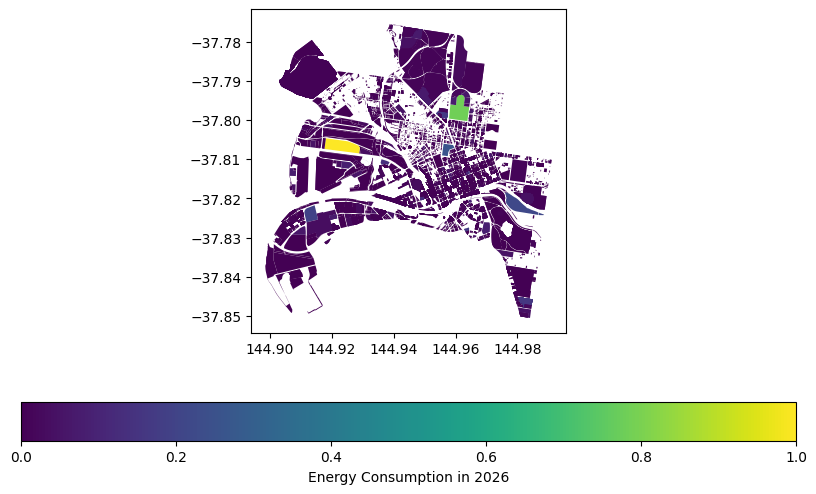

In [17]:
def plot_energy_consumption_by_year(df, year):
    # 根据选定的年份筛选数据
    if year not in [2011, 2016, 2021, 2026]:
        print("Unsupported year. Please choose from 2011, 2016, 2021, 2026.")
        return

    # 创建数据副本
    df_copy = df.copy()

    # 根据年份选择对应的能源消耗列
    total_column = f"total_{year}"

    # 确保该列存在于DataFrame中
    if total_column not in df_copy.columns:
        print(f"The column '{total_column}' does not exist in the DataFrame.")
        return

    # 能源消耗数据进行标准化
    df_copy[total_column] = (
        df_copy[total_column] - df_copy[total_column].min()) / (
            df_copy[total_column].max() - df_copy[total_column].min())

    # 绘图
    fig, ax = plt.subplots(1, 1, figsize=(20, 12))
    df_copy.plot(column=total_column, ax=ax, legend=True,
             legend_kwds={'label': f"Energy Consumption in {year}", 'orientation': "horizontal"})
    plt.show()

plot_energy_consumption_by_year(df_2011, 2011)
plot_energy_consumption_by_year(df_2016, 2016)
plot_energy_consumption_by_year(df_2021, 2021)
plot_energy_consumption_by_year(df_2021_l, 2026)

In [67]:
# 标准化能源消耗列名
df_2011['Energy Consumption'] = df_2011['total_2011']
df_2016['Energy Consumption'] = df_2016['total_2016']
df_2021['Energy Consumption'] = df_2021['total_2021']
df_2026['Energy Consumption'] = df_2026['total_2026']

# 合并数据集
frames = [df_2011, df_2016, df_2021, df_2026]
df_combined = pd.concat(frames)

# 添加年份标识
#df_combined['Census Year'] = df_combined.apply(
#    lambda row: 2011 if row.name in df_2011.index else (
#        2016 if row.name in df_2016.index else (
#            2021 if row.name in df_2021.index else 2026
#        )
#    ),
#    axis=1
#)


In [70]:
df_combined

,Census year,Block ID,Property ID,CLUE small area,Trading name,Business address,Industry (ANZSIC4) code,Industry (ANZSIC4) description,Geo Point,geometry,total_2011,property_id,floor_area,Energy Consumption,total_2016,total_2021,total_2026
1,2011,260,103276,Carlton,The Arthouse,614-616 Elizabeth Street MELBOURNE 3000,4400,Accommodation,"-37.80389369105187, 144.95893869538546","MULTIPOLYGON (((144.95903 -37.80380, 144.95909...",244.502837,103276.0,0.00,244.502837,NaN,NaN,NaN
4,2011,261,103278,Carlton,Passion Studio,"Level 1, 594 Elizabeth Street MELBOURNE 3000",8212,Arts Education,"-37.80441358151051, 144.9591306771443","MULTIPOLYGON (((144.95927 -37.80443, 144.95904...",3.194093,103278.0,0.00,3.194093,NaN,NaN,NaN
7,2011,261,103278,Carlton,Ray's Outdoors,"Ground , 594 Elizabeth Street MELBOURNE 3000",4241,Sport and Camping Equipment Retailing,"-37.80441358151051, 144.9591306771443","MULTIPOLYGON (((144.95927 -37.80443, 144.95904...",3.194093,103278.0,0.00,3.194093,NaN,NaN,NaN
10,2011,261,103279,Carlton,Ducati City MotorCycle Retailing,582-590 Elizabeth Street MELBOURNE 3000,3912,Motor Cycle Retailing,"-37.804602920016904, 144.95933490824575","MULTIPOLYGON (((144.95959 -37.80463, 144.95916...",389.219378,103279.0,0.00,389.219378,NaN,NaN,NaN
13,2011,261,103287,Carlton,Classic Colour Copying Pty Ltd,"Ground , 540 Elizabeth Street MELBOURNE 3000",1611,Printing,"-37.80545057821005, 144.9597136984272","MULTIPOLYGON (((144.95991 -37.80549, 144.95955...",42.290454,103287.0,0.00,42.290454,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49457,2026,224,102420,Carlton,Vacant,10-12 David Street CARLTON VIC 3053,0,Vacant Space,"-37.797109886348025, 144.97203508309082","MULTIPOLYGON (((144.97212 -37.79717, 144.97193...",NaN,102420.0,0.00,0.000000,NaN,NaN,0.000000
49458,2026,239,107547,Carlton,226 Jubang,Part 226 Pelham Street MELBOURNE VIC 3000,4512,Takeaway Food Services,"-37.801683996710835, 144.95824298826534","MULTIPOLYGON (((144.95826 -37.80177, 144.95820...",NaN,107547.0,150.20,19.252926,NaN,NaN,19.252926
49459,2026,856,109887,South Yarra,Vacant,177-181 Walsh Street SOUTH YARRA VIC 3141,0,Vacant Space,"-37.83387671785113, 144.98531467949826","MULTIPOLYGON (((144.98511 -37.83378, 144.98555...",NaN,109887.0,563.08,44.783022,NaN,NaN,44.783022
49460,2026,927,106407,Parkville,Vacant,101-105 Manningham Street PARKVILLE VIC 3052,0,Vacant Space,"-37.78447231814965, 144.94130458786003","MULTIPOLYGON (((144.94120 -37.78465, 144.94106...",NaN,106407.0,806.05,157.236091,NaN,NaN,157.236091


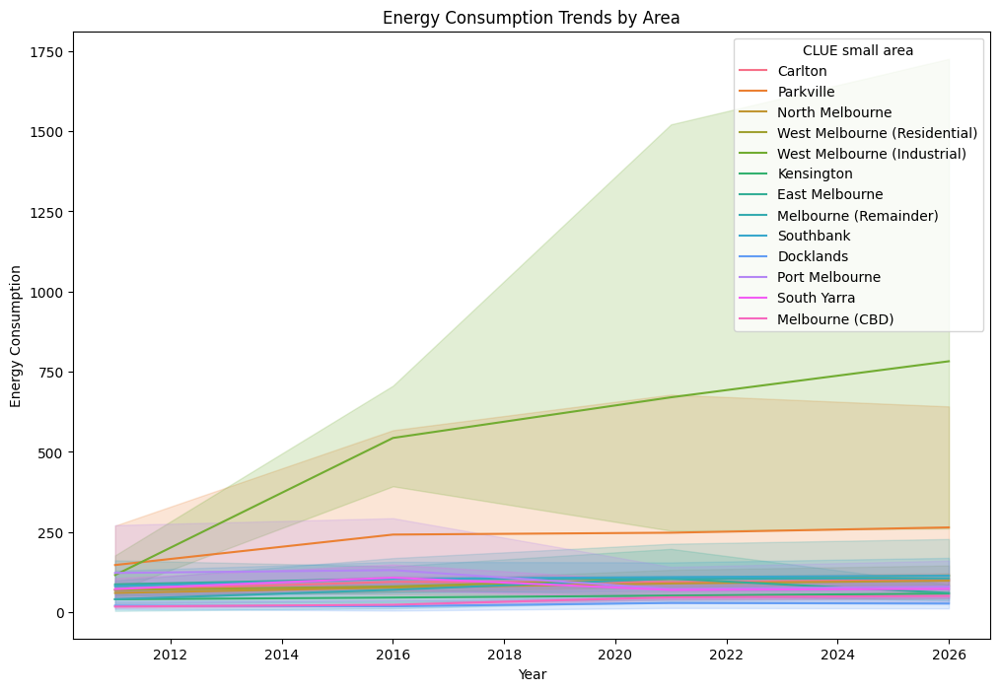

In [74]:
# 绘制每个小区域在不同年份的能源消耗
plt.figure(figsize=(12, 8))
sns.lineplot(data=df_combined, x='Census year', y='Energy Consumption', hue='CLUE small area')
plt.title('Energy Consumption Trends by Area')
plt.xlabel('Year')
plt.ylabel('Energy Consumption')
plt.show()


In [71]:
# 特征可能包括地区、行业、楼层面积等
features = ['CLUE small area', 'Industry (ANZSIC4) code', 'floor_area', 'Energy Consumption']
target = 'Energy Consumption'

# 准备特征矩阵和目标向量
X = df_combined[features]
y = df_combined[target]


In [72]:
# 创建ColumnTransformer以对分类数据应用OneHotEncoder
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', ['floor_area', 'Energy Consumption']),
        ('cat', OneHotEncoder(handle_unknown='ignore'), ['CLUE small area', 'Industry (ANZSIC4) code'])
    ])

# 创建包含预处理步骤和随机森林回归模型的Pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
])

# 准备特征和目标变量
features = ['CLUE small area', 'Industry (ANZSIC4) code', 'floor_area', 'Energy Consumption']
target = 'Energy Consumption'
X = df_combined[features]
y = df_combined[target]

# 数据切分
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 使用管道训练模型
pipeline.fit(X_train, y_train)

# 进行预测
y_pred = pipeline.predict(X_test)

# 计算和打印误差
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

mae = mean_absolute_error(y_test, y_pred)
print(f"MAE: {mae}")

r2 = r2_score(y_test, y_pred)
print(f"R2: {r2}")

Mean Squared Error: 638.9680103646681
MAE: 0.39912706644129387
R2: 0.9981587746309998


In [73]:
# 分离2026年的数据作为单独的验证集
df_validation = df_combined[df_combined['Census year'] == 2026]
df_train_test = df_combined[df_combined['Census year'] != 2026]

# 重新划分训练集和测试集，不包括2026年数据
X_train, X_test, y_train, y_test = train_test_split(
    df_train_test[features],
    df_train_test[target],
    test_size=0.2,
    random_state=42
)

# 训练模型
pipeline.fit(X_train, y_train)

# 验证模型
y_validation_pred = pipeline.predict(df_validation[features])

validation_mse = mean_squared_error(df_validation[target], y_validation_pred)
print(f"MSE 2026: {validation_mse}")

validation_mae = mean_absolute_error(df_validation[target], y_validation_pred)
print(f"MAE: {validation_mae}")

validation_r2 = r2_score(df_validation[target], y_validation_pred)
print(f"R2: {validation_r2}")

MSE 2026: 66984.08435673731
MAE: 3.2536788082612893
R2: 0.8938918809986086


In [75]:
df_validation

,Census year,Block ID,Property ID,CLUE small area,Trading name,Business address,Industry (ANZSIC4) code,Industry (ANZSIC4) description,Geo Point,geometry,total_2011,property_id,floor_area,Energy Consumption,total_2016,total_2021,total_2026
2,2026,260,103276,Carlton,The Last Jar,Royal Artillery Hotel 614-616 Elizabeth Street...,4520,"Pubs, Taverns and Bars","-37.80389369105187, 144.95893869538546","MULTIPOLYGON (((144.95903 -37.80380, 144.95909...",NaN,103276.0,0.00,106.027972,NaN,NaN,106.027972
5,2026,261,103278,Carlton,Kt Mart,Ground & Part Level 1 594 Elizabeth Street MEL...,4110,Supermarket and Grocery Stores,"-37.80441358151051, 144.9591306771443","MULTIPOLYGON (((144.95927 -37.80443, 144.95904...",NaN,103278.0,0.00,7.422789,NaN,NaN,7.422789
6,2026,261,103278,Carlton,Passion Dance Studio,Part Level 1 594 Elizabeth Street MELBOURNE VI...,8212,Arts Education,"-37.80441358151051, 144.9591306771443","MULTIPOLYGON (((144.95927 -37.80443, 144.95904...",NaN,103278.0,0.00,7.422789,NaN,NaN,7.422789
11,2026,261,103279,Carlton,Leona Party and Home,582-590 Elizabeth Street MELBOURNE VIC 3000,4213,Houseware Retailing,"-37.804602920016904, 144.95933490824575","MULTIPOLYGON (((144.95959 -37.80463, 144.95916...",NaN,103279.0,0.00,850.972535,NaN,NaN,850.972535
15,2026,261,103287,Carlton,Construction Forestry Mining and Energy Union,"Part Ground & Part Lvl 4 & Level 3, 5-7 540 El...",9552,Labour Association Services,"-37.80545057821005, 144.9597136984272","MULTIPOLYGON (((144.95991 -37.80549, 144.95955...",NaN,103287.0,0.00,46.396117,NaN,NaN,46.396117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49457,2026,224,102420,Carlton,Vacant,10-12 David Street CARLTON VIC 3053,0,Vacant Space,"-37.797109886348025, 144.97203508309082","MULTIPOLYGON (((144.97212 -37.79717, 144.97193...",NaN,102420.0,0.00,0.000000,NaN,NaN,0.000000
49458,2026,239,107547,Carlton,226 Jubang,Part 226 Pelham Street MELBOURNE VIC 3000,4512,Takeaway Food Services,"-37.801683996710835, 144.95824298826534","MULTIPOLYGON (((144.95826 -37.80177, 144.95820...",NaN,107547.0,150.20,19.252926,NaN,NaN,19.252926
49459,2026,856,109887,South Yarra,Vacant,177-181 Walsh Street SOUTH YARRA VIC 3141,0,Vacant Space,"-37.83387671785113, 144.98531467949826","MULTIPOLYGON (((144.98511 -37.83378, 144.98555...",NaN,109887.0,563.08,44.783022,NaN,NaN,44.783022
49460,2026,927,106407,Parkville,Vacant,101-105 Manningham Street PARKVILLE VIC 3052,0,Vacant Space,"-37.78447231814965, 144.94130458786003","MULTIPOLYGON (((144.94120 -37.78465, 144.94106...",NaN,106407.0,806.05,157.236091,NaN,NaN,157.236091
